<a href="https://colab.research.google.com/github/AlaaAlawwad/DataAnalyticsTrainning/blob/main/ProjectPSUT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Decision Tree model

In [ ]:
!pip install graphviz pydotplus


In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier , plot_tree , export_graphviz
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from six import StringIO  # Import StringIO directly from 'six'
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
from IPython.display import Image
import pydotplus
import graphviz

In [ ]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
train_df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
X_train = train_df.drop('satisfaction', axis=1)
y_train = train_df['satisfaction']

X_test = test_df.drop('satisfaction', axis=1)
y_test = test_df['satisfaction']

In [ ]:
dt_model = DecisionTreeClassifier(random_state=42)

In [ ]:
#Identify categorical columns
categorical_cols = ['Gender', 'Customer Type', 'Type of Travel', 'Class']

# Apply one-hot encoding
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train[categorical_cols]))
X_test_encoded = pd.DataFrame(encoder.transform(X_test[categorical_cols]))

#Set column names for encoded features
X_train_encoded.columns = encoder.get_feature_names_out(categorical_cols)
X_test_encoded.columns = encoder.get_feature_names_out(categorical_cols)

In [ ]:
# Drop original categorical columns and concatenate encoded features
X_train = X_train.drop(categorical_cols, axis=1).reset_index(drop=True)
X_train = pd.concat([X_train, X_train_encoded], axis=1)

X_test = X_test.drop(categorical_cols, axis=1).reset_index(drop=True)
X_test = pd.concat([X_test, X_test_encoded], axis=1)

In [ ]:
# Initialize and fit the model
dt_model = DecisionTreeClassifier(random_state=42, max_depth=5) # Limit the depth of the tree
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [ ]:
# Make predictions on the test set
y_pred = dt_model.predict(X_test)

In [ ]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Decision Tree Accuracy: {accuracy * 100:.2f}%')
print('Classification Report:')
print(classification_report(y_test, y_pred))
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))

Decision Tree Accuracy: 90.48%
Classification Report:
                         precision    recall  f1-score   support

neutral or dissatisfied       0.91      0.93      0.92     14573
              satisfied       0.90      0.88      0.89     11403

               accuracy                           0.90     25976
              macro avg       0.90      0.90      0.90     25976
           weighted avg       0.90      0.90      0.90     25976

Confusion Matrix:
[[13498  1075]
 [ 1397 10006]]


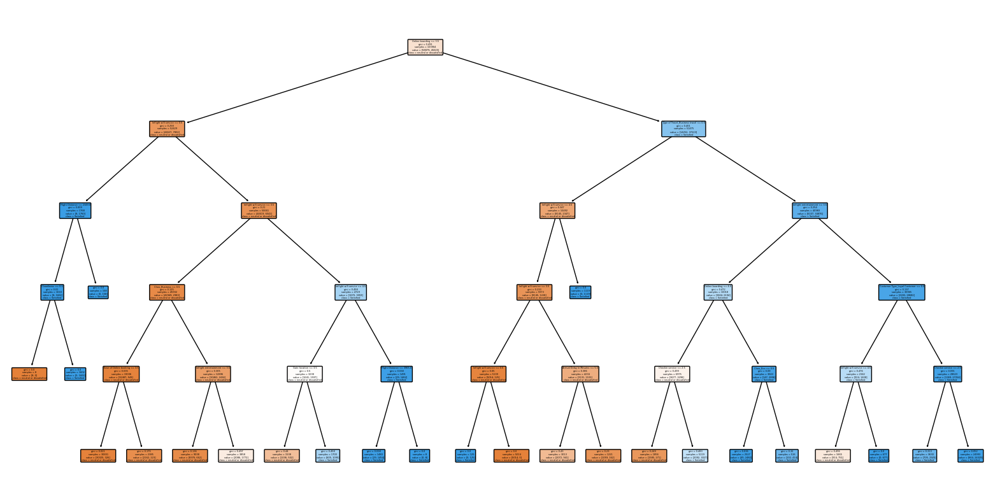

In [ ]:
# Visualize the Decision Tree
plt.figure(figsize=(20, 10))  # Adjust the size as needed
plot_tree(dt_model, feature_names=X_train.columns,
          class_names=['neutral or dissatisfied', 'Satisfied'],
          filled=True, rounded=True)
plt.show()

In [ ]:
# Create a dot file and visualize it
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns, class_names=['neutral or dissatisfied', 'Satisfied'])

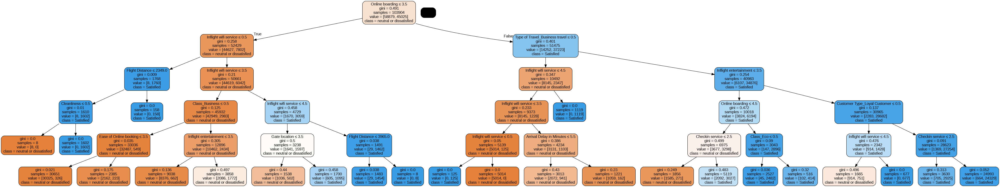

In [ ]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

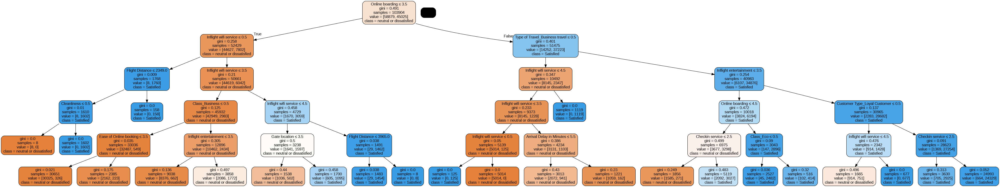

In [ ]:
# Use pydotplus to generate the graph
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Random Forest

In [ ]:
!pip install scikit-learn
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
!pip install graphviz
!apt-get install graphviz

import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
import graphviz

# Create an imputer object
imputer = SimpleImputer(strategy='mean')  # Replace with 'median' or other strategies if needed

# Fit the imputer on your training data and transform both training and test data
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train))
X_test_imputed = pd.DataFrame(imputer.transform(X_test))

# Keep the column names
X_train_imputed.columns = X_train.columns
X_test_imputed.columns = X_test.columns

# Now fit the Random Forest model on the imputed data
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_imputed, y_train)

# ... rest of your code

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


RandomForestClassifier(random_state=42)

In [ ]:
tree = rf_model.estimators_[0]
# Export the tree to DOT format
dot_data = export_graphviz(tree,
                           out_file=None,
                           feature_names=X_train_imputed.columns,
                           class_names=['neutral or dissatisfied', 'Satisfied'],
                           filled=True,
                           rounded=True,
                           special_characters=True)

# Create a graph from the DOT data
graph = graphviz.Source(dot_data)

# This is the crucial step to actually SHOW the visualization
graph


#  K-Means


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler ,OneHotEncoder
from sklearn.compose import ColumnTransformer

In [ ]:
df1 = pd.read_csv('train.csv')
df2 = pd.read_csv('test.csv')
df3 =  pd.concat([df1, df2], ignore_index=True)
X = df3[['Class', 'Type of Travel' , 'Leg room service' , 'On-board service','Inflight entertainment', 'Inflight wifi service']]

In [ ]:
# Assuming 'X' is your DataFrame with mixed data types
# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

In [ ]:
# Create transformers for numerical and categorical data
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')  # Handle unknown categories during testing

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

In [ ]:
# Fit and transform the data
X_scaled = preprocessor.fit_transform(X)

In [ ]:
# Initialize the K-Means model with a specified number of clusters
kmeans = KMeans(n_clusters=3, random_state=42)  # Replace 3 with the number of clusters you want

# Fit the model to the data
kmeans.fit(X_scaled)

# Predict the clusters for each data point
clusters = kmeans.predict(X_scaled)

# Add the cluster labels to the original dataframe
df3['Cluster'] = clusters


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [ ]:
# Print the inertia (within-cluster sum of squares)
print(f'Inertia: {kmeans.inertia_}')

# Centroids of the clusters
print('Cluster Centers:', kmeans.cluster_centers_)

Inertia: 424258.4436089935
Cluster Centers: [[ 0.33792994  0.56234258  0.49383329 -0.80441876  0.50389456  0.43629895
   0.05980648  0.58073471  0.41926529]
 [-0.6396838  -0.79106002 -0.80675947 -0.23096896  0.31326072  0.59452283
   0.09221645  0.61229553  0.38770447]
 [ 0.49699888  0.48446945  0.56586448  1.01414302  0.66295136  0.27794371
   0.05910493  0.88764236  0.11235764]]


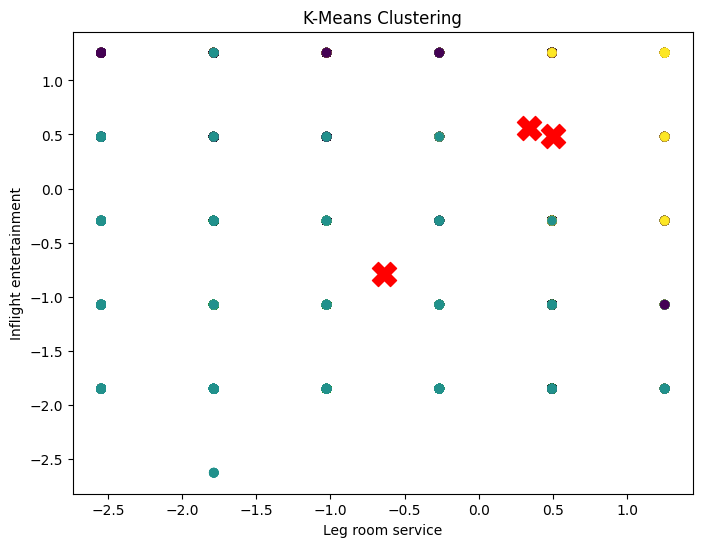

In [ ]:
# Visualizing the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap='viridis', marker='o')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', marker='X')  # Cluster centers
plt.title('K-Means Clustering')
plt.xlabel('Leg room service')  # Replace with actual feature name
plt.ylabel('Inflight entertainment')  # Replace with actual feature name
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

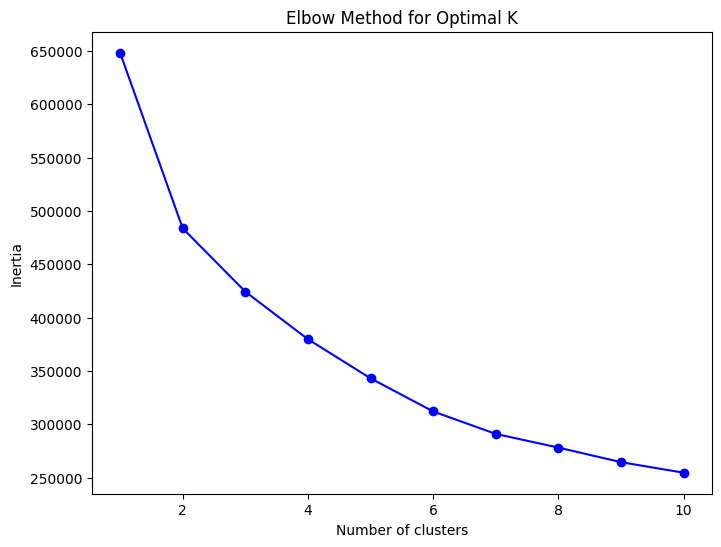

In [ ]:
inertia = []
K_range = range(1, 11)  # You can adjust the range

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(K_range, inertia, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()
